In [1]:
using Gadfly;

INFO: Precompiling module Gadfly.


In [2]:
using Cairo;

In [3]:
using Distributions;

In [4]:
using DataFrames;

# Simple Plotting

In [5]:
# Create 5 x-coordinate and 5 y-coordinate points, each value drawn at random from
# the values 1 through 5
# The semi-colon at the end supresses output to the screen (just don't anything after it)
xvals = rand(1:5, 5)

5-element Array{Int64,1}:
 5
 4
 3
 5
 1

In [6]:
yvals = rand(1:5, 5)

5-element Array{Int64,1}:
 5
 5
 2
 4
 4

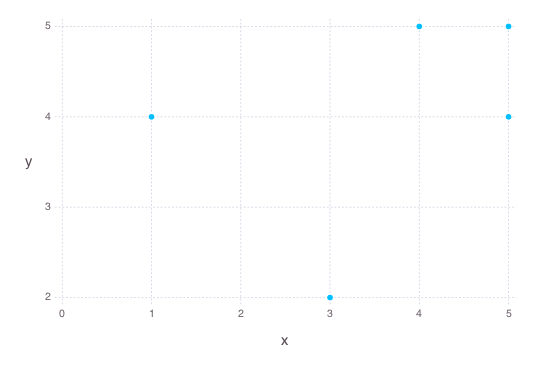

In [7]:
plot(x=xvals, y=yvals)

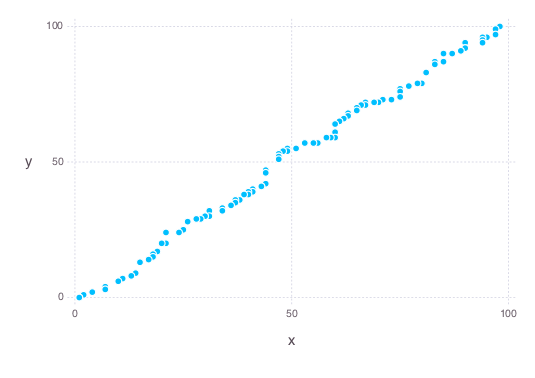

In [8]:
xvals2 = rand(0:100, 100) # 100 random values taken from the integers 0 through 100
yvals2 = rand(0:100, 100) # 100 random values taken from the integers 0 through 100

# Using the sort function (which changes the correlation)
plot(x = sort(xvals2), y = sort(yvals2))

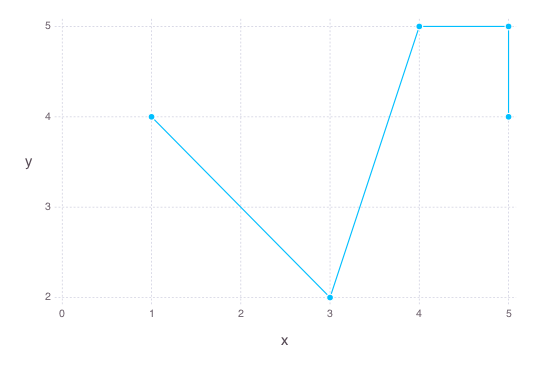

In [9]:
# Adding another geomtery, which in this case is a line connecting the points
# The point and line geometries act on the xvals and yvals arrays
plot(x = xvals, y = yvals, Geom.point, Geom.line)

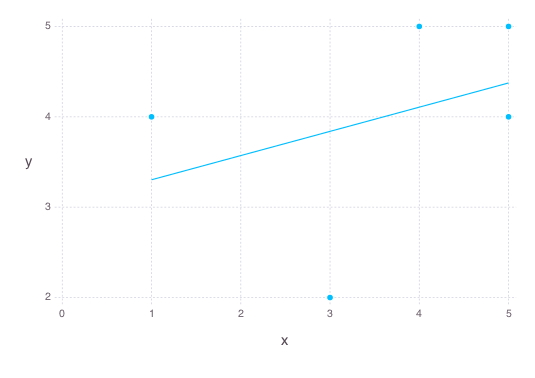

In [10]:
# We can also smooth out the line
plot(x = xvals, y = yvals, Geom.point, Geom.smooth(method = :lm)) #Geom.smooth(method = :loess) is default

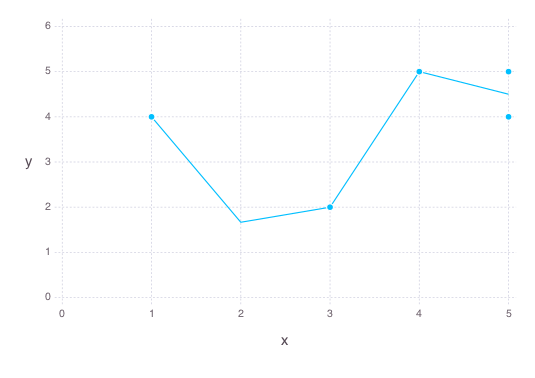

In [12]:
# We can also smooth out the line
plot(x = xvals, y = yvals, Geom.point, Geom.smooth(method = :loess)) #Geom.smooth(method = :lm)) is default

# Adding Layers

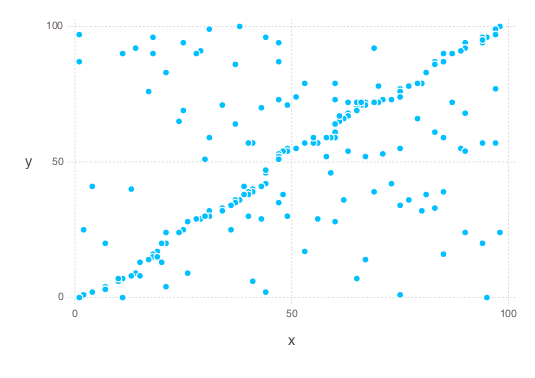

In [13]:
# Adding another layer using the layer() function
# The geometry has to be specified now
plot(layer(x = xvals2, y = yvals2, Geom.point), layer(x = sort(xvals2), y = sort(yvals2), Geom.point))

# Using Themes

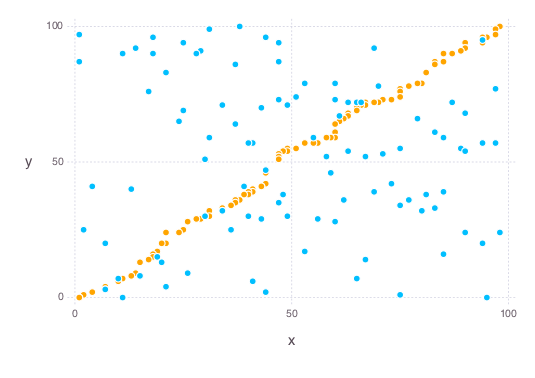

In [14]:
# It was not clear from the plot above that we were plotting two layers
# New in 0.6: The colorant prefix is no longer required
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = "orange")))

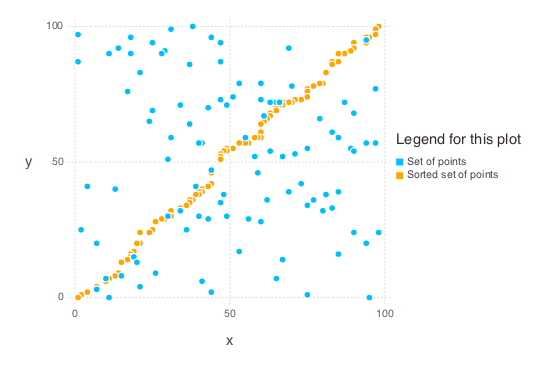

In [15]:
# Another way of doing layers
# Adding a legend
# New in 0.6
points1 = layer(x = xvals2, y = yvals2, Geom.point, Theme(default_color = "deepskyblue"))
points2 = layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = "orange"))
plot(points1, points2, Guide.manual_color_key("Legend for this plot",
["Set of points", "Sorted set of points"], ["deepskyblue", "orange"]))

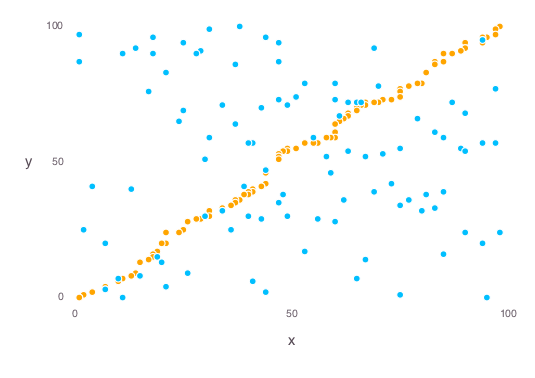

In [16]:
# Changing the grid color
# New in 0.6
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = "orange")),
Theme(grid_color = "white"))

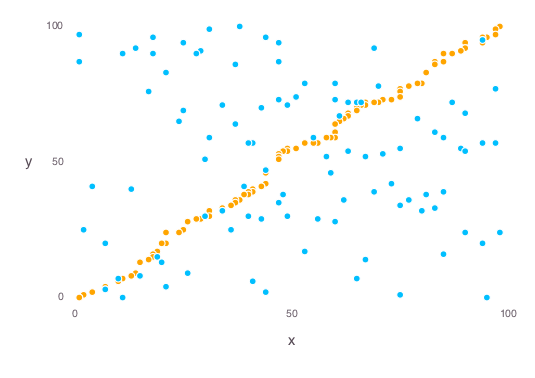

In [17]:
# Changing the grid color
# New in 0.6
plot(layer(x = xvals2, y = yvals2, Geom.point),
layer(x = sort(xvals2), y = sort(yvals2), Geom.point, Theme(default_color = "orange")),
Theme(grid_color = "white", grid_color_focused = "white"))

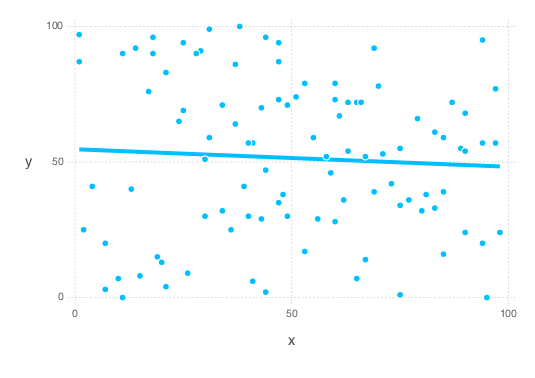

In [18]:
# Changing the size (stroke thickness) of the line
# Changing the line model
plot(x = xvals2, y = yvals2, Geom.point, Geom.smooth(method = :lm), Theme(line_width = 4px))

# Adding titles and axis labels

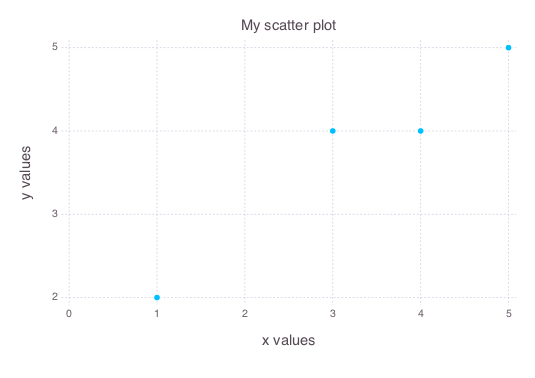

In [19]:
# Adding a plot title
# Adding a label for the x- and y-axes
plot(x = sort(xvals), y = sort(yvals), Geom.point, 
Guide.title("My scatter plot"),
Guide.xlabel("x values"), Guide.ylabel("y values"))

# Saving a plot

In [20]:
# Using normal distribution
# Calling the draw() function
# Saving the file as a PNG (using Cairo)
draw(PNG("myqqplot.png", 8inch, 6inch),
plot(x = rand(Normal(), 100), y = Normal(), Stat.qq, Geom.point, Guide.title("QQ plot")))

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] quantile(::Distributions.Normal{Float64}, ::Array{Float64,1}) at ./deprecated.jl:57
 [3] qqbuild(::Array{Float64,1}, ::Distributions.Normal{Float64}) at /Users/ravikumar/.julia/v0.6/Distributions/src/qq.jl:18
 [4] apply_statistic(::Gadfly.Stat.QQStatistic, ::Dict{Symbol,Gadfly.ScaleElement}, ::Gadfly.Coord.Cartesian, ::Gadfly.Aesthetics) at /Users/ravikumar/.julia/v0.6/Gadfly/src/statistics.jl:1491
 [5] apply_statistics(::Array{Gadfly.StatisticElement,1}, ::Dict{Symbol,Gadfly.ScaleElement}, ::Gadfly.Coord.Cartesian, ::Gadfly.Aesthetics) at /Users/ravikumar/.julia/v0.6/Gadfly/src/statistics.jl:42
 [6] render_prepare(::Gadfly.Plot) at /Users/ravikumar/.julia/v0.6/Gadfly/src/Gadfly.jl:696
 [7] render(::Gadfly.Plot) at /Users/ravikumar/.julia/v0.6/Gadfly/src/Gadfly.jl:755
 [8] draw(::Compose.Image{Compose.PNGBackend}, ::Gadfly.Plot) at /Users/ravikumar/.julia/v0.6/Gadfly/src/Gadfly.jl:869
 [9] include_string(::String, 

# Plotting from data

In [21]:
# Importing a .csv file and using the semicolon to supress the output
data = readtable("GadflyTutorialData.csv");

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] #readtable#232(::Bool, ::Char, ::Array{Char,1}, ::Char, ::Array{String,1}, ::Array{String,1}, ::Array{String,1}, ::Bool, ::Int64, ::Array{Symbol,1}, ::Array{Any,1}, ::Bool, ::Char, ::Bool, ::Int64, ::Array{Int64,1}, ::Bool, ::Symbol, ::Bool, ::Bool, ::DataFrames.#readtable, ::String) at /Users/ravikumar/.julia/v0.6/DataFrames/src/deprecated.jl:1045
 [3] readtable(::String) at /Users/ravikumar/.julia/v0.6/DataFrames/src/deprecated.jl:1045
 [4] include_string(::String, ::String) at ./loading.jl:522
 [5] softscope_include_string(::Module, ::String, ::String) at /Users/ravikumar/.julia/v0.6/SoftGlobalScope/src/SoftGlobalScope.jl:51
 [6] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/ravikumar/.julia/v0.6/IJulia/src/execute_request.jl:193
 [7] (::Compat.#inner#14{Array{Any,1},IJulia.#execute_request,Tuple{ZMQ.Socket,IJulia.Msg}})() at /Users/ravikumar/.julia/v0.6/Compat/src/Compat.jl:332
 [8] eventloop(::ZMQ.Sock

In [22]:
# Looking at the last rows
# We note 200 row entries (patients)
# Gender, age, 4 variables and 3 categories
tail(data, 3)

,Patient,Gender,Age,Variable1,Variable2,Variable3,Variable4,Category1,Category2,Category3
1,198,M,49,11.2,95,1.8,53,B,X,R
2,199,M,36,24.2,97,8.2,58,A,R,P
3,200,F,48,10.3,114,20.4,63,B,C,P


In [26]:
# Data types in each column
# Note that there are no missing values
showcols(data)
# describe(data, stats=[:eltype, :nmissing, :first, :last])

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] showcols(::DataFrames.DataFrame, ::Bool, ::Bool) at ./deprecated.jl:57 (repeats 2 times)
 [3] include_string(::String, ::String) at ./loading.jl:522
 [4] softscope_include_string(::Module, ::String, ::String) at /Users/ravikumar/.julia/v0.6/SoftGlobalScope/src/SoftGlobalScope.jl:51
 [5] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/ravikumar/.julia/v0.6/IJulia/src/execute_request.jl:193
 [6] (::Compat.#inner#14{Array{Any,1},IJulia.#execute_request,Tuple{ZMQ.Socket,IJulia.Msg}})() at /Users/ravikumar/.julia/v0.6/Compat/src/Compat.jl:332
 [7] eventloop(::ZMQ.Socket) at /Users/ravikumar/.julia/v0.6/IJulia/src/eventloop.jl:8
 [8] (::IJulia.##13#16)() at ./task.jl:335
while loading In[26], in expression starting on line 3


,variable,eltype,nmissing,first,last
1,Patient,Int64,0,1,200
2,Gender,String,0,F,F
3,Age,Int64,0,37,48
4,Variable1,Float64,0,22.3,10.3
5,Variable2,Int64,0,104,114
6,Variable3,Float64,0,5.3,20.4
7,Variable4,Int64,0,64,63
8,Category1,String,0,A,B
9,Category2,String,0,C,C
10,Category3,String,0,P,P


In [27]:
# Count of number per group of gender
# Use the values for categorical data analysis
by(data, :Gender, d -> DataFrame(SampleSize = size(d, 1)))

,Gender,SampleSize
1,F,100
2,M,100


In [71]:
data

,Patient,Gender,Age,Variable1,Variable2,Variable3,Variable4,Category1,Category2,Category3
1,1,F,37,22.3,104,5.3,64,A,C,P
2,2,F,55,12.1,84,12.7,58,B,X,Q
3,3,M,44,15.6,101,6.9,68,A,R,Q
4,4,F,54,20.8,111,14.8,54,B,C,R
5,5,M,41,21.5,106,25.1,50,A,X,P
6,6,F,51,14.7,112,14.1,70,B,R,R
7,7,M,42,18.7,99,0.3,63,A,C,P
8,8,M,50,22.1,102,5.7,62,B,X,R
9,9,M,50,11.6,114,12.0,64,A,R,P
10,10,F,55,18.9,107,7.8,54,B,C,P


In [70]:
plot(by(data, :C, x = "Gender", y = "Age"))

LoadError: [91mMethodError: no method matching by(::DataFrames.DataFrame, ::Symbol; x="Gender", y="Age")[0m
Closest candidates are:
  by(::DataFrames.AbstractDataFrame, ::Any, [91m::Function[39m; sort) at /Users/ravikumar/.julia/v0.6/DataFrames/src/groupeddataframe/grouping.jl:304[91m got unsupported keyword arguments "x", "y"[39m
  by(::DataFrames.AbstractDataFrame, ::Any, [91m::Array{Symbol,1}[39m) at deprecated.jl:56[91m got unsupported keyword arguments "x", "y"[39m
  by(::DataFrames.AbstractDataFrame, ::Any, [91m::Symbol[39m) at deprecated.jl:56[91m got unsupported keyword arguments "x", "y"[39m[39m

In [28]:
# Descriptive statistics of the Age column
describe(data[:Age])

Summary Stats:
Length:         200
Type:           Union{Int64, Missings.Missing}
Number Unique:  21


In [29]:
describe(data[:Category1])

Summary Stats:
Length:         200
Type:           Union{Missings.Missing, String}
Number Unique:  2


# Box with whisker plots

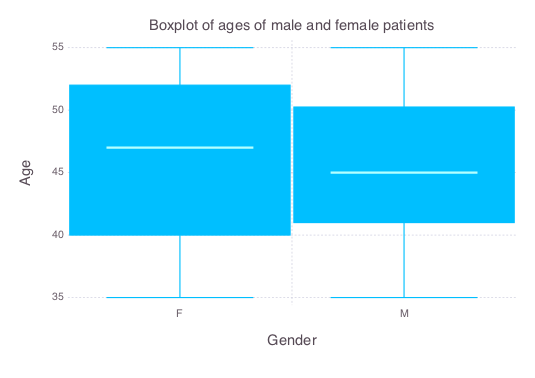

In [30]:
# Using a string and a symbol to refer to a column name for the x and y aesthetics
plot(data, x = "Gender", y = :Age, Geom.boxplot,
Guide.title("Boxplot of ages of male and female patients"),
Guide.xlabel("Gender"))

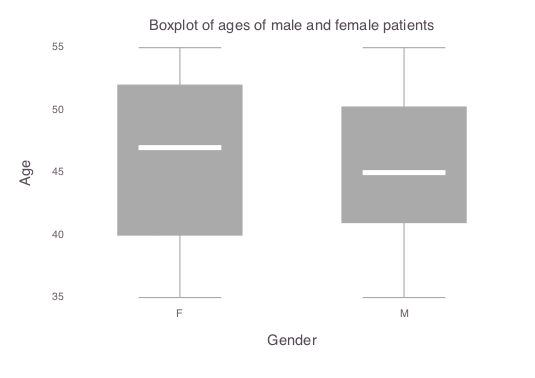

In [31]:
# Changing the size (stroke thickness) of the median line
# Change the color of the boxes and whiskers
# Increase the spacing between the boxes (making them thinner)
# New in 0.6
plot(data, x = "Gender", y = "Age", Geom.boxplot,
Guide.title("Boxplot of ages of male and female patients"),
Guide.xlabel("Gender"),
Theme(boxplot_spacing = 100px, grid_color = "white", default_color = "#AAAAAA",
middle_width = 5px))

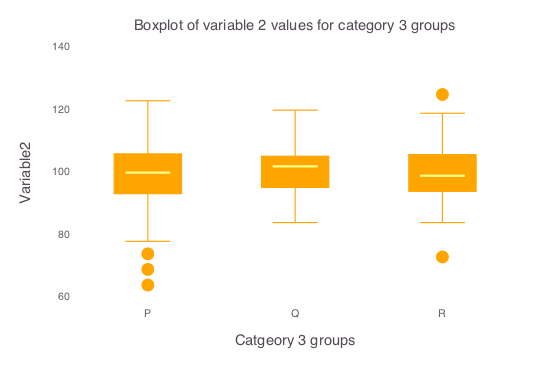

In [32]:
# Some more categories (by using Category 3) # New in 0.6
# Bigger outlier points
plot(data, x = "Category3", y = "Variable2", Geom.boxplot,
Guide.title("Boxplot of variable 2 values for category 3 groups"),
Guide.xlabel("Catgeory 3 groups"), Theme(default_color = "orange",
grid_color = "white", grid_color_focused = "white",
boxplot_spacing = 80px, point_size = 7px))

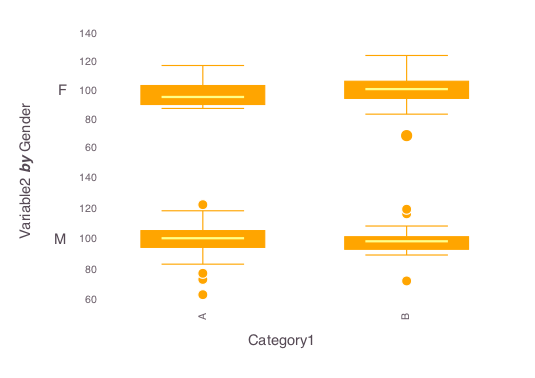

In [33]:
# Subplots to add another dimension to the plot
# New in 0.6
plot(data, ygroup = "Gender", x = "Category1", y = "Variable2", Geom.subplot_grid(Geom.boxplot),
Theme(default_color = "orange",
grid_color = "white", grid_color_focused = "white",
boxplot_spacing = 80px, point_size = 5px))

# Density Plots

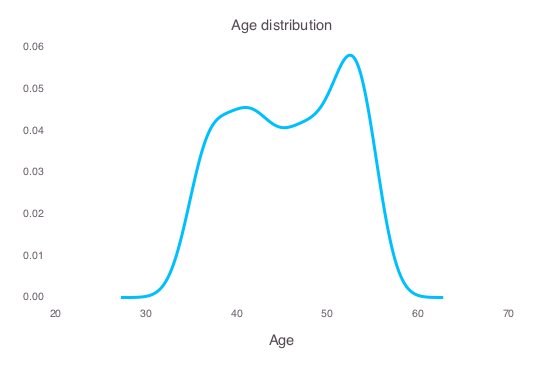

In [34]:
# Density estimate of ages
# New in 0.6
plot(data, x = "Age", Geom.density,
Guide.title("Age distribution"),
Theme(grid_color = "white", grid_color_focused = "white", line_width = 3px))

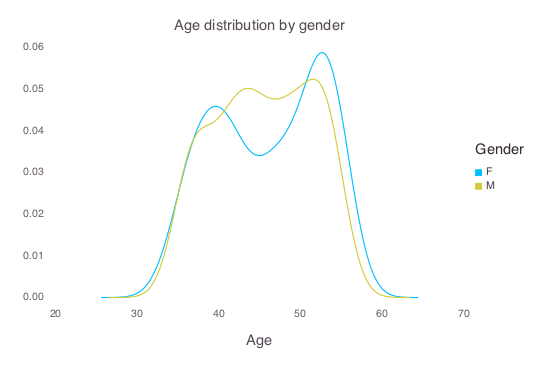

In [73]:
# Age distribution by group using the color argument
# New in 0.6
plot(data, x = "Age", color = "Gender", Geom.density,
Guide.title("Age distribution by gender"),
Theme(grid_color = "white", grid_color_focused = "white"))

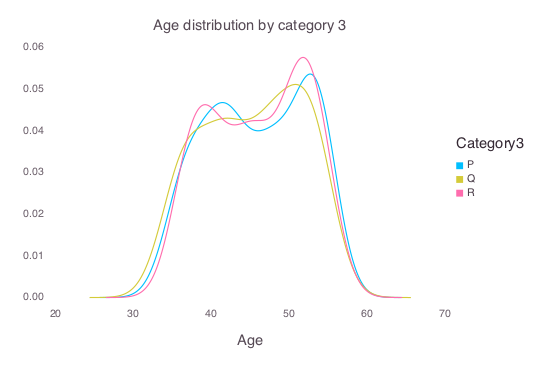

In [36]:
# New in 0.6
plot(data, x = "Age", color = "Category3", Geom.density,
Guide.title("Age distribution by category 3"),
Theme(grid_color = "white", grid_color_focused = "white"))

# Historgrams

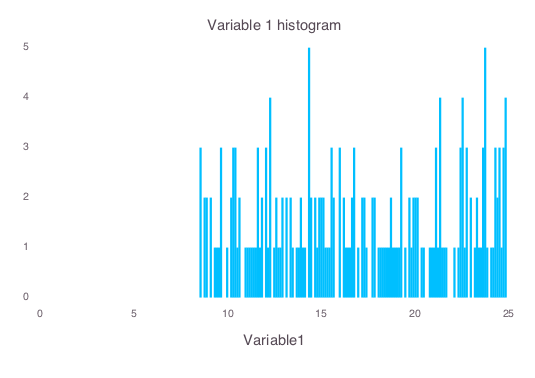

In [37]:
# New in 0.6
plot(data, x = "Variable1", Geom.histogram,
Guide.title("Variable 1 histogram"),
Theme(grid_color = "white", grid_color_focused = "white"))

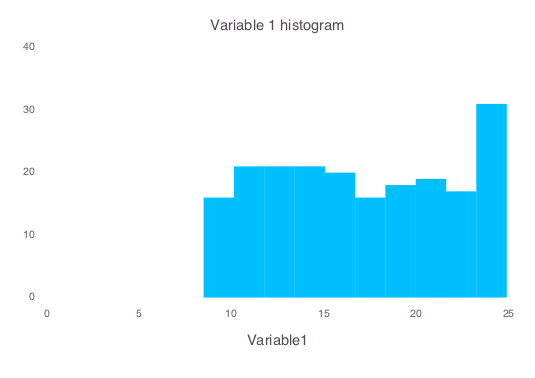

In [38]:
# Controlling the bincount
# New in 0.6
plot(data, x = "Variable1", Geom.histogram(bincount = 10),
Guide.title("Variable 1 histogram"),
Theme(grid_color = "white", grid_color_focused = "white"))

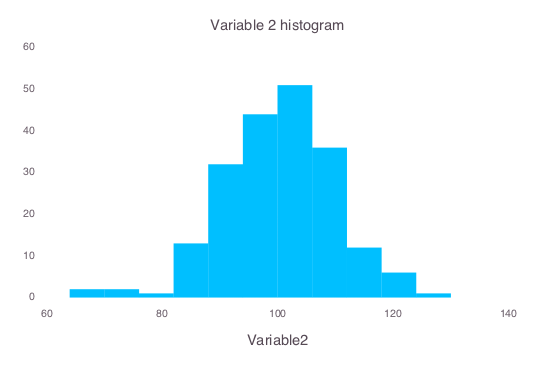

In [43]:
# A variable with a more normal distribution
# New in 0.6
plot(data, x = "Variable2", Geom.histogram(bincount = 11),
Guide.title("Variable 2 histogram"),
Theme(grid_color = "white", grid_color_focused = "white"))

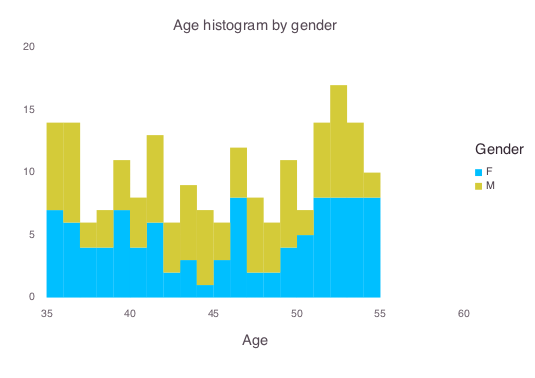

In [44]:
# An x-axis variable for more than one categorical groups
# New in 0.6
plot(data, x = "Age", color = "Gender", Geom.histogram(bincount = 21),
Guide.title("Age histogram by gender"),
Theme(grid_color = "white", grid_color_focused = "white"))

# Violin plots

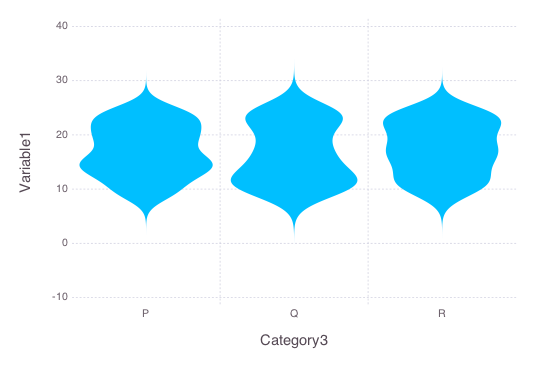

In [45]:
plot(data, x = :Category3, y = :Variable1, Geom.violin)

# QQ plots

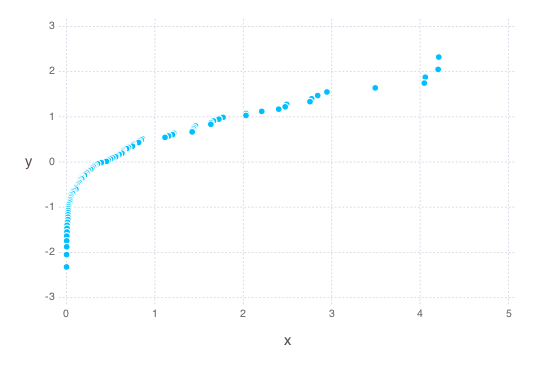

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] quantile(::Distributions.Normal{Float64}, ::Array{Float64,1}) at ./deprecated.jl:57
 [3] qqbuild(::Array{Float64,1}, ::Distributions.Normal{Float64}) at /Users/ravikumar/.julia/v0.6/Distributions/src/qq.jl:18
 [4] apply_statistic(::Gadfly.Stat.QQStatistic, ::Dict{Symbol,Gadfly.ScaleElement}, ::Gadfly.Coord.Cartesian, ::Gadfly.Aesthetics) at /Users/ravikumar/.julia/v0.6/Gadfly/src/statistics.jl:1491
 [5] apply_statistics(::Array{Gadfly.StatisticElement,1}, ::Dict{Symbol,Gadfly.ScaleElement}, ::Gadfly.Coord.Cartesian, ::Gadfly.Aesthetics) at /Users/ravikumar/.julia/v0.6/Gadfly/src/statistics.jl:42
 [6] render_prepare(::Gadfly.Plot) at /Users/ravikumar/.julia/v0.6/Gadfly/src/Gadfly.jl:696
 [7] render(::Gadfly.Plot) at /Users/ravikumar/.julia/v0.6/Gadfly/src/Gadfly.jl:755
 [8] show at /Users/ravikumar/.julia/v0.6/Gadfly/src/Gadfly.jl:959 [inlined]
 [9] limitstringmime(::MIME{Symbol("image/svg+xml")}, ::Gadfly.Plot) at 

In [46]:
# These sample point were not from a population in which the underlying variable is
# normally distributed (cannot use non-parametric tests)
plot(x = rand(Chisq(1), 100), y = Normal(), Stat.qq, Geom.point)

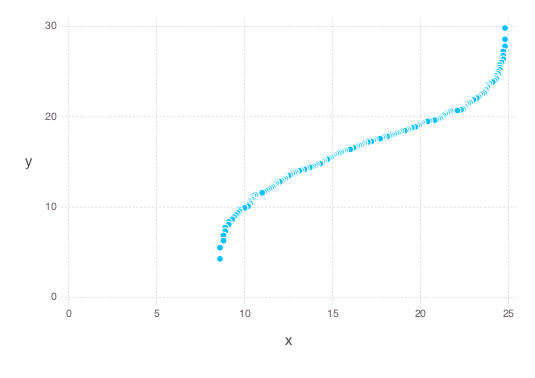

In [47]:
# Checking to see if variable 1 is from a sample in which the underlying population has that
# variable normally distributed
plot(x = sort(data[:Variable1]), y = Normal(mean(data[:Variable1]), std(data[:Variable1])), Stat.qq, Geom.point)

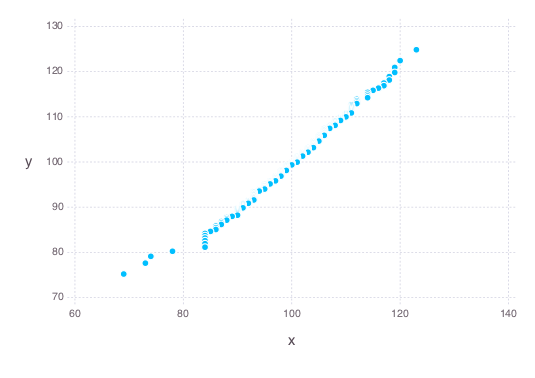

In [48]:
# Variable 2
plot(x = sort(data[:Variable2]), y = Normal(mean(data[:Variable2]), std(data[:Variable2])), Stat.qq, Geom.point)

# Scatter plots

Stacktrace:
 [1] depwarn(::String, ::Symbol) at ./deprecated.jl:70
 [2] Gadfly.Guide.ColorKey(::String) at ./deprecated.jl:57
 [3] include_string(::String, ::String) at ./loading.jl:522
 [4] softscope_include_string(::Module, ::String, ::String) at /Users/ravikumar/.julia/v0.6/SoftGlobalScope/src/SoftGlobalScope.jl:51
 [5] execute_request(::ZMQ.Socket, ::IJulia.Msg) at /Users/ravikumar/.julia/v0.6/IJulia/src/execute_request.jl:193
 [6] (::Compat.#inner#14{Array{Any,1},IJulia.#execute_request,Tuple{ZMQ.Socket,IJulia.Msg}})() at /Users/ravikumar/.julia/v0.6/Compat/src/Compat.jl:332
 [7] eventloop(::ZMQ.Socket) at /Users/ravikumar/.julia/v0.6/IJulia/src/eventloop.jl:8
 [8] (::IJulia.##13#16)() at ./task.jl:335
while loading In[49], in expression starting on line 2


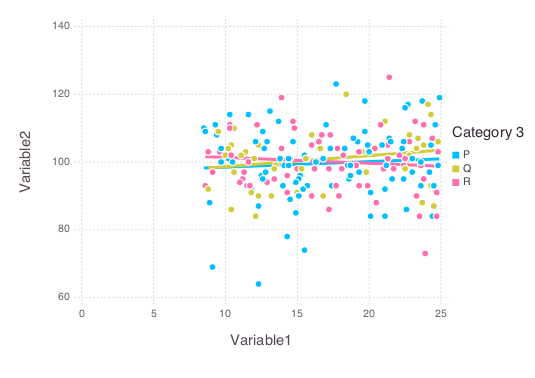

In [49]:
# Setting the title for the graph key (legend)
plot(data, x = "Variable1", y ="Variable2", color = "Category3",
Geom.point, Geom.smooth(method = :lm), Guide.colorkey("Category 3"), Theme(line_width = 3px))

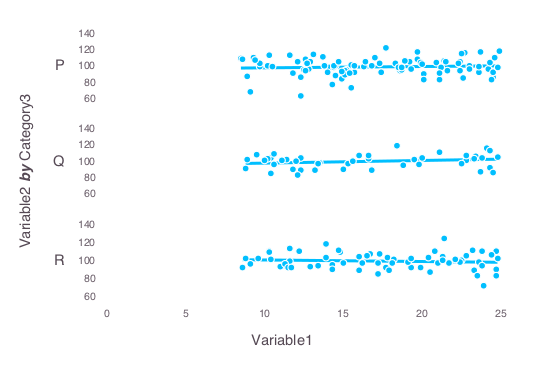

In [50]:
# Subplots to add another dimension to the plot
plot(data, ygroup = "Category3", x = "Variable1", y = "Variable2",
Geom.subplot_grid(Geom.point, Geom.smooth(method = :lm)),
Theme(grid_color = colorant"white", line_width = 3px))

# Vertical and Horizontal Lines


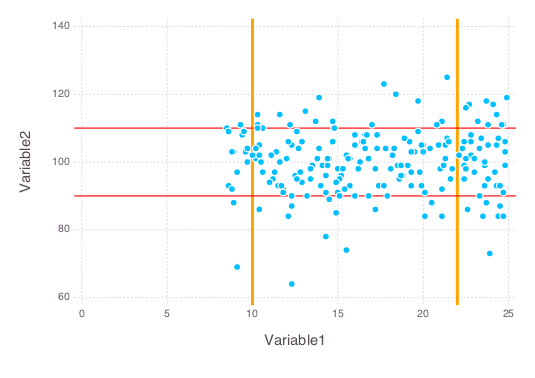

In [51]:
# Drawing two vertical and two horizontal lines
# Adding size and color
plot(data, x = "Variable1", y = "Variable2", yintercept = [90, 110], Geom.point, Geom.hline(color = colorant"Red"),
xintercept = [10, 22], Geom.vline(size = 3px, color = colorant"Orange"))

# More Examples

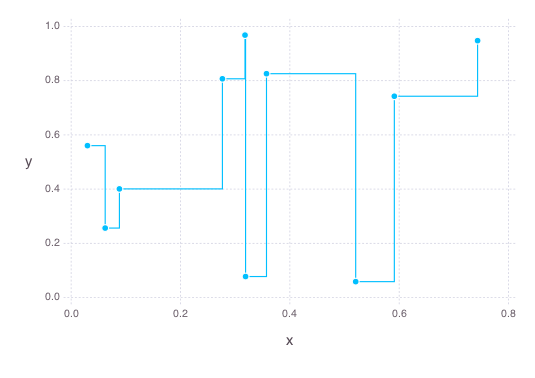

In [52]:
# Horizontal then vertical
x = rand(10)
y = rand(10)
plot(x = x, y = y, Geom.point, Geom.step(direction = :hv))

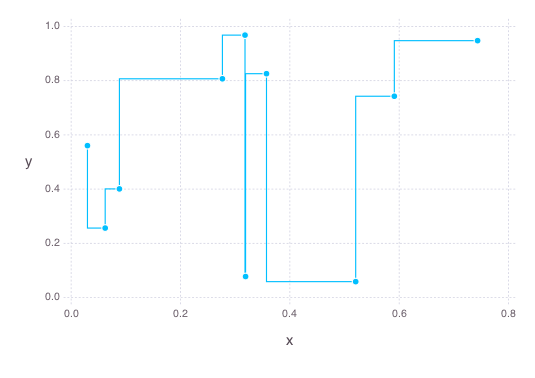

In [53]:
# Vertical then horizontal
plot(x = x, y = y, Geom.point, Geom.step(direction = :vh))

#  Beeswarm

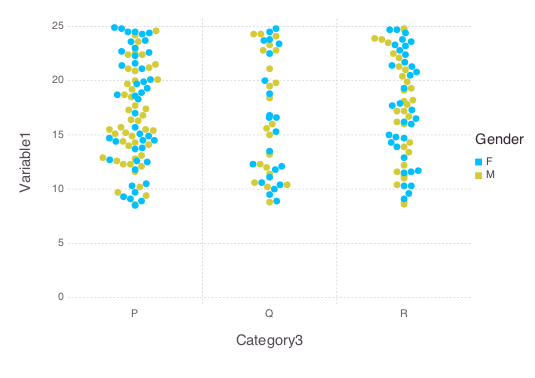

In [54]:
plot(data, x = :Category3, y = :Variable1, color = :Gender, Geom.beeswarm)

# Continuous color scales

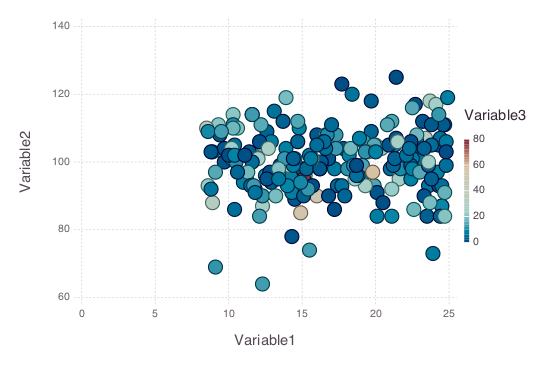

In [55]:
# New in 0.6
plot(data, x = :Variable1, y = :Variable2, color = :Variable3,
Scale.color_continuous(minvalue = minimum(data[:Variable3]), maxvalue = maximum(data[:Variable3])),
Theme(point_size = 7px))

# Manually choosing colors

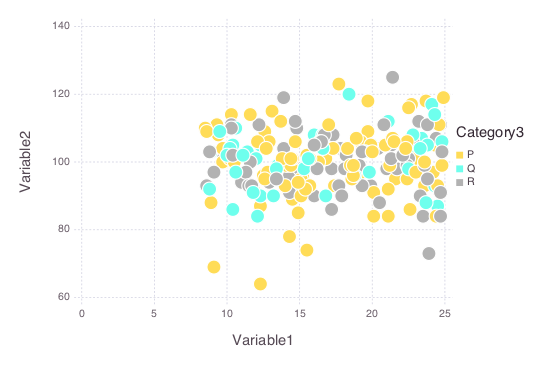

In [56]:
# New in 0.6
plot(data, x = :Variable1, y = :Variable2, color = :Category3, Geom.point,
Scale.color_discrete_manual(colorant"#FFDC57", colorant"#6EFFED", colorant"#B2B2B2"),
Theme(point_size = 7px))

# Another way of getting rid of the grid lines

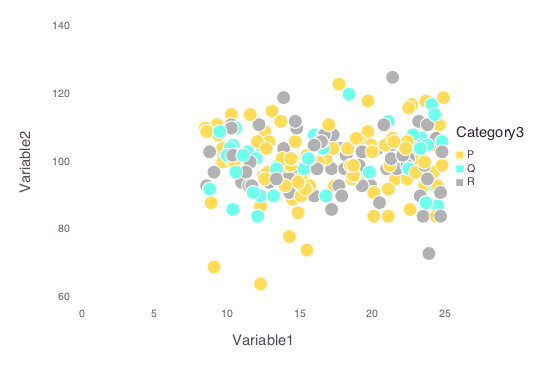

In [57]:
# New in 0.6
plot(data, x = :Variable1, y = :Variable2, color = :Category3, Geom.point,
Scale.color_discrete_manual(colorant"#FFDC57", colorant"#6EFFED", colorant"#B2B2B2"),
Theme(point_size = 7px, grid_line_width = 0px))

In [74]:
data

,Patient,Gender,Age,Variable1,Variable2,Variable3,Variable4,Category1,Category2,Category3
1,1,F,37,22.3,104,5.3,64,A,C,P
2,2,F,55,12.1,84,12.7,58,B,X,Q
3,3,M,44,15.6,101,6.9,68,A,R,Q
4,4,F,54,20.8,111,14.8,54,B,C,R
5,5,M,41,21.5,106,25.1,50,A,X,P
6,6,F,51,14.7,112,14.1,70,B,R,R
7,7,M,42,18.7,99,0.3,63,A,C,P
8,8,M,50,22.1,102,5.7,62,B,X,R
9,9,M,50,11.6,114,12.0,64,A,R,P
10,10,F,55,18.9,107,7.8,54,B,C,P


In [75]:
d1 = data

,Patient,Gender,Age,Variable1,Variable2,Variable3,Variable4,Category1,Category2,Category3
1,1,F,37,22.3,104,5.3,64,A,C,P
2,2,F,55,12.1,84,12.7,58,B,X,Q
3,3,M,44,15.6,101,6.9,68,A,R,Q
4,4,F,54,20.8,111,14.8,54,B,C,R
5,5,M,41,21.5,106,25.1,50,A,X,P
6,6,F,51,14.7,112,14.1,70,B,R,R
7,7,M,42,18.7,99,0.3,63,A,C,P
8,8,M,50,22.1,102,5.7,62,B,X,R
9,9,M,50,11.6,114,12.0,64,A,R,P
10,10,F,55,18.9,107,7.8,54,B,C,P


In [77]:
d1[:CatRK4] = rand(Normal(0, 1), 100)

LoadError: [91mArgumentError: New columns must have the same length as old columns[39m